In [1]:
import jax
import jax.numpy as jnp
from jax import jit, vmap
import pandas as pd

from ott.geometry import pointcloud
from ott.problems.linear import linear_problem
from ott.solvers.linear import sinkhorn
from ott.problems.linear import potentials

import matplotlib.pyplot as plt
import scienceplots
import seaborn as sns
import os

import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objs as go



plt.style.use(['default'])

## Recap of Optimal Transport history

The Monge problem is defined as the minimization over the set of transformations $T \in \mathcal{T}(P,Q)$:

$$
\min_{T \in \mathcal{T}(P,Q)} \int \left\| x - T(x) \right\|^2 \, dP(x)
$$
Define the set of transformations $\mathcal{T}(P, Q)$:

$$
\mathcal{T}(P, Q) := \{T : \Omega \rightarrow \Omega \mid T_{\#}P = P \circ T^{-1} = Q\}
$$

where $T_{\#}P = P \circ T^{-1} = Q$ implies that $T$ pushes forward the distribution $P$ to $Q$ through the inverse transformation $T^{-1}$.







One of the main problem is that we do not have acces directly to the distribution of $Q$ but to a sample $X_1, \ldots, X_n \sim P$ so now have to solve this equation :  

Consider the expected squared L2-norm of the difference between $ \hat{T}_n$  and  $T_0 $:

$$
\mathbb{E}\left[ \|\hat{T}_n - T_0\|^2_{L^2(P)} \right] \leq n^{-\frac{2\alpha}{2\alpha+2}d} \log^3(n),
$$


Therefore if  an optimal map $T_0 \in \mathcal{T}(P,Q)$ the estimators requires at least $O(n^3)$ time to compute.

However if we rephrase the problem using Kantorovich formulation we have this : 

$$
\min_{\pi \in \Pi(P,Q)} \int \frac{1}{2} \|x - y\|^2 \, d\pi(x, y),
$$

where the set $ \Pi(P, Q) $ is defined as:

$$
\Pi(P, Q) := \{\pi \in P(\Omega \times \Omega) \mid \pi(A \times \Omega) = P(A), \pi(\Omega \times A) = Q(A)\}
$$


Thanks to Bernier's theorem we can reformulate the primal problem into a dual :

$$
\sup_{(f,g) \in \Phi} \left( \int f \, dP + \int g \, dQ \right),
$$

where the set $\Phi$ consists of:

$$
\Phi = \left\{ (f, g) \in L^1(P) \times L^1(Q) \mid f(x) + g(y) \leq \frac{1}{2} \|x - y\|^2 \text{ for all } x, y \in \Omega \right\}
$$

$$
S_\epsilon (P,Q) = \inf_{\pi \in \Pi(P,Q)} \left( \int \frac{1}{2} \|x - y\|^2 \, d\pi(x, y) + \epsilon D_{KL}(\pi \| P \otimes Q) \right),
$$


where $ \Pi(P, Q) $ is a set of joint distributions $ \pi $ with marginals  $P$  and $Q$ , and $ D_{KL} $ denotes the Kullback-Leibler divergence.


The all points of this formulation with the entropy in to obtain this : 

$$
\mathbb{E}\left[ \|\hat{T} - T_0\|^2_{L^2(P)} \right] \leq n^{-\frac{\alpha+1}{2d+\alpha+1}} \log n,
$$

Therefore the problem in only $O(n^2)$ to compute and we can use the Sinkhorn algorithm in order to identify our optimal map.

In practice we are more interested in this formulation of the problem : 



$$
S_\epsilon (P,Q) = \inf_{\pi \in \Pi(P,Q)} \left( \int \frac{1}{2} \|x - y\|^2 \, d\pi(x, y) + \epsilon \int \log(\pi) \, d\pi - \epsilon (\text{Ent} P + \text{Ent} Q) \right),
$$




and its dual is : 


$$
S_\epsilon(P, Q) = \sup_{\substack{f \in L^1(P) \\ g \in L^1(Q)}} \left( \int f \, dP + \int g \, dQ - \epsilon \int \int \left(e^{(f(x)+g(y)-\frac{1}{2}\|x-y\|^2)/\epsilon}\right) \, dP(x) \, dQ(y) \right) + \epsilon.
$$



One of the key point of this paper is the use of the barycentric projection define as :



$$
T_e(x) := \int y \, d\pi_e(y) = \mathbb{E}_{\pi_e}[Y \mid X= x].
$$


This measure is specificaly choose to not extend outside the sample points.

In [2]:
@jit
def gravitational_lensing(coordinates, mass_radius=1, strength=10):
    """
    Apply a gravitational lensing effect to coordinates.

    Parameters:
        coordinates (jax.numpy array): Array of shape (..., n, d) containing coordinates.
        mass_radius (float): Radius of the gravitational mass. Defaults to 1.
        strength (float): Strength of the gravitational lensing effect. Defaults to 0.1.

    Returns:
        jax.numpy array: Transformed coordinates.
    """
    def lens_single(coord):
        r = jnp.linalg.norm(coord, axis=-1, keepdims=True)
        scale_factor = jnp.where(r < mass_radius, 1.0, 1.0 - strength * mass_radius / r)
        return coord * scale_factor[..., None]

    lens_vectorized = vmap(lens_single)
    return lens_vectorized(coordinates).squeeze()


In [3]:
# Generating multivariate normal data
n = 500
d = 3
rng = jax.random.PRNGKey(42)

samples = jax.random.multivariate_normal(rng, jnp.ones(d), jnp.eye(d), (n,))
target_samples = gravitational_lensing(samples)

In [4]:
# Compute the entropic map
def optimal_transport_map(samples, target_samples, epsilon = 0.1):
    """
    Compute the optimal transport map between two point clouds.
    :param samples:
    :param target_samples:
    :param epsilon: Entropy regularization parameter.
    :return: Optimal transport map between the two point clouds
    """
    geom = pointcloud.PointCloud(samples, target_samples, epsilon = epsilon)
    prob = linear_problem.LinearProblem(geom)

    solver = sinkhorn.Sinkhorn()
    out = solver(prob)
    f = out.f
    g = out.g
    entropic_potentials = potentials.EntropicPotentials(f, g, prob)
    map = entropic_potentials.transport
    return map

In [5]:
# Visualisation of transported samples in 2d and in 3d
def plot_point_clouds(samples, target_samples, third_samples=None, dim=3):
    """
    Plot two or three point clouds in 2D or 3D using matplotlib or plotly.
    :param samples: Initial point cloud.
    :param target_samples: Target point cloud.
    :param third_samples: (Optional) Third point cloud.
    :param dim: Dimension of the point clouds (2 or 3). Defaults to 3.
    :return:
    """
    if dim == 2:
        fig, ax = plt.subplots(figsize=(5, 5))
        ax.scatter(samples[:, 0], samples[:, 1], c='red', label='Initial samples', marker='x')
        ax.scatter(target_samples[:, 0], target_samples[:, 1], c='blue', label='Target samples', marker='x')

        if third_samples is not None:
            ax.scatter(third_samples[:, 0], third_samples[:, 1], c='green', label='Third samples', marker='^')

        ax.legend()
        plt.show()
    else:
        data = [
            go.Scatter3d(x=samples[:, 0], y=samples[:, 1], z=samples[:, 2],
                         mode='markers', name='Initial samples', marker=dict(color='red', size=2)),
            go.Scatter3d(x=target_samples[:, 0], y=target_samples[:, 1], z=target_samples[:, 2],
                         mode='markers', name='Target samples', marker=dict(color='blue', size=2))
        ]

        if third_samples is not None:
            data.append(go.Scatter3d(x=third_samples[:, 0], y=third_samples[:, 1], z=third_samples[:, 2],
                                     mode='markers', name='Transported samples', marker=dict(color='green', size=2)))

        fig = go.Figure(data=data)
        fig.show()



In [6]:
rng = jax.random.PRNGKey(42)
test_samples = jax.random.multivariate_normal(rng, jnp.ones(d), jnp.eye(d), (n,))
map = optimal_transport_map(test_samples, target_samples) 
transported_samples = map(test_samples)

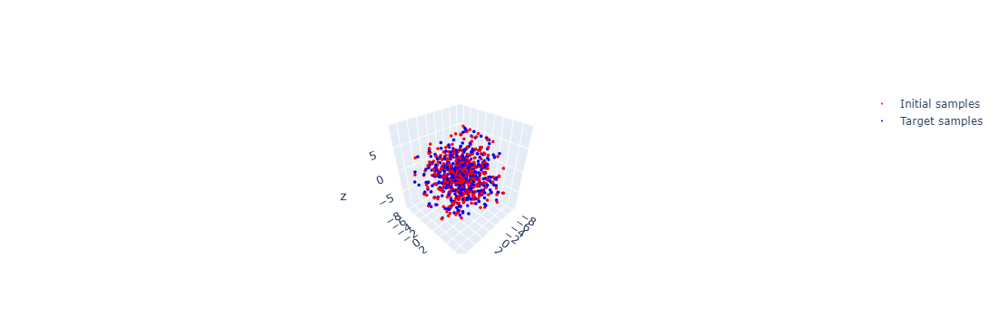

In [7]:
plot_point_clouds(target_samples, transported_samples)

## Effects of the regularization parameter on the optimal transport map and the transported samples.

Recall the definition of Kullback-Leibler divergence between two distributions $P$ and $Q$:

$$
D_{KL}(P||Q) = \int p(x) \log \frac{p(x)}{q(x)} dx
$$

And the impact of $\epsilon$ on the entropic map

$$
S_\epsilon (P,Q) = \inf_{\pi \in \Pi(P,Q)} \left( \int \frac{1}{2} \|x - y\|^2 \, d\pi(x, y) + \epsilon \int \log(\pi) \, d\pi - \epsilon (\text{Ent} P + \text{Ent} Q) \right),
$$




The Sinkorn algorithm updates at each step $k$ the entropic map using this equation  : 

$$
T^{(k)}(x) = \frac{\sum_{i=1}^n Y_i e^{\frac{1}{\epsilon}g^{(k)}(Y_i) - \frac{1}{2} \| Y_i - x \|^2}}{\sum_{i=1}^n e^{\frac{1}{\epsilon}g^{(k)}(Y_i) - \frac{1}{2} \| Y_i - x \|^2}}
$$


Where $g^{(k)}$ and $f^{(k+1)}$ are defined as follows:

$g^{(k)}(y) = -\epsilon \log \left( \frac{1}{n} \sum_{i=1}^n e^{\frac{1}{\epsilon}g^{(k)}(X_i) - \frac{1}{2} \| X_i - y \|^2} \right)$

$f^{(k+1)}(y) = -\epsilon \log \left( \frac{1}{n} \sum_{i=1}^n e^{\frac{1}{\epsilon}g^{(k)}(Y_i) - \frac{1}{2} \| Y_i - x \|^2} \right)$


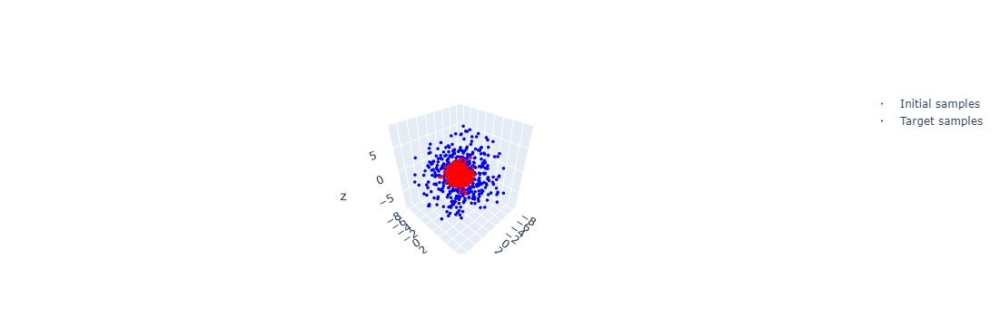

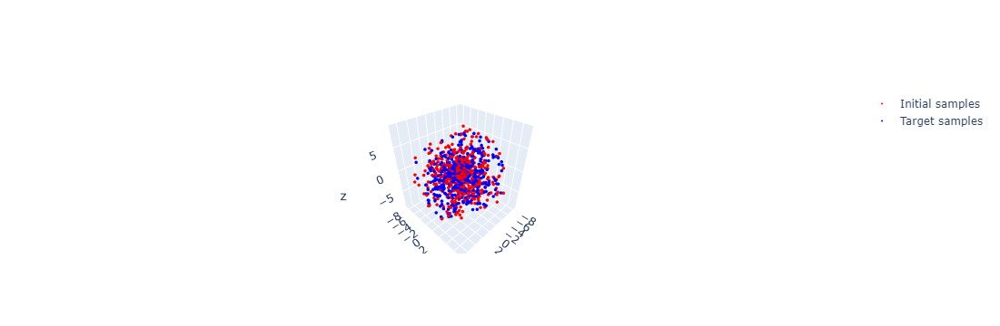

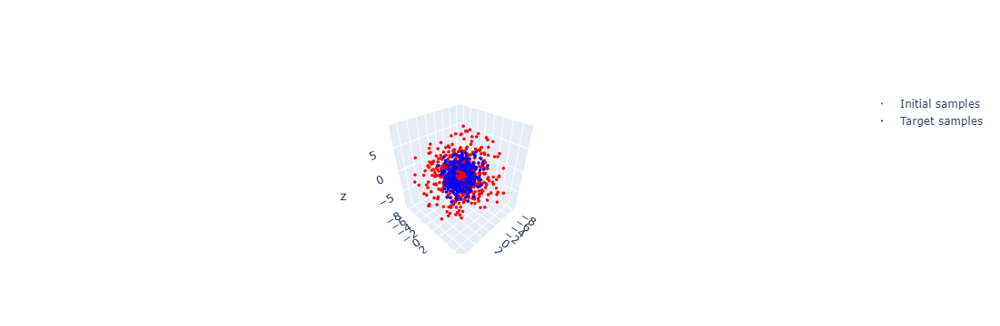

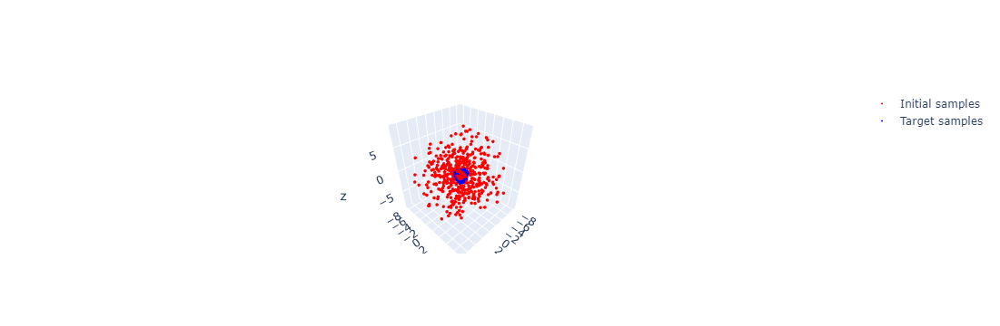

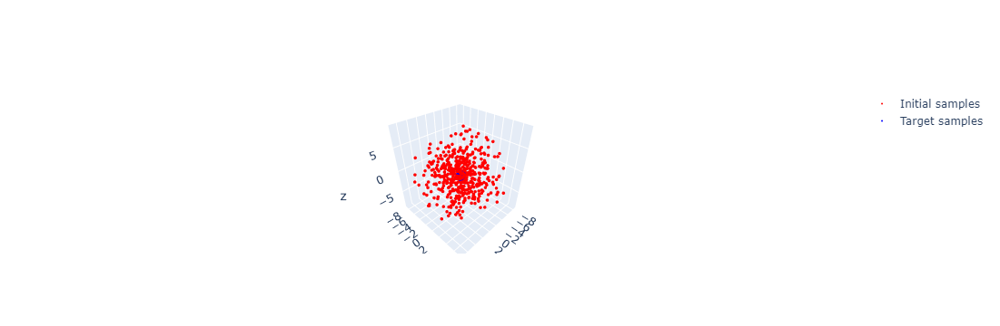

In [8]:
plot_point_clouds(samples, target_samples)

epsilons = [1, 10, 50, 100]

for epsilon in epsilons:
    rng = jax.random.PRNGKey(0)
    test_samples = jax.random.multivariate_normal(rng, jnp.ones(d), jnp.eye(d), (n,))
    map = optimal_transport_map(samples, target_samples, epsilon = epsilon)
    transported_samples = map(test_samples)

    plot_point_clouds(target_samples, transported_samples)

One can observe that by increasing $\epsilon$, the map becomes less rich. The points are less spread out and stay in some sort of barycenter of the initial gravitational cloud. It can be linked with what we have seen in the course of Marco Cuturi.

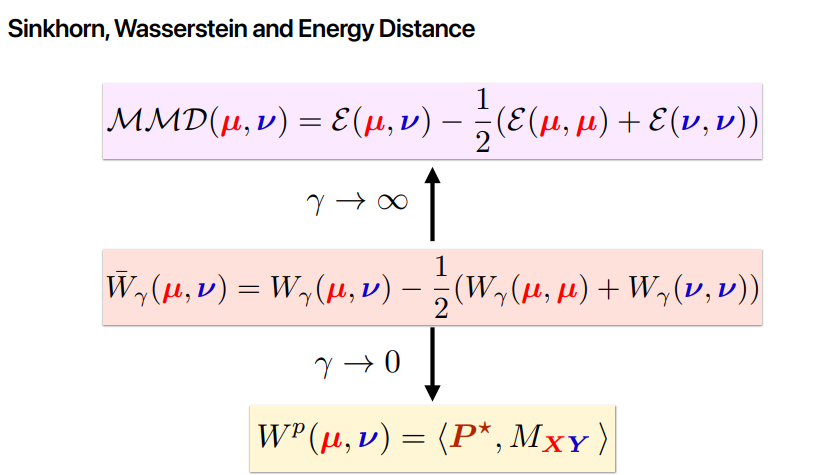

## Quadratic time complexity
Here, we will test the time complexity of the optimal transport map. We will generate gaussian samples in 3 dimensions and compute the optimal transport map between the samples and the target samples. We will measure the time it takes to compute the optimal transport map for different number of samples.

In [18]:
import time
from tqdm import tqdm
import jax
import jax.numpy as jnp

# Assuming you have defined or imported the optimal_transport_map function elsewhere
# from your_module import optimal_transport_map  # Adjust the import according to your actual function location

n_samples = [50, 100, 200, 500, 1000, 5000,7500, 10000, 12500, 15000]
times = dict()
d = 2  # Define the dimension of your samples, adjust as needed

for n in tqdm(n_samples):
    rng = jax.random.PRNGKey(42)
    samples = jax.random.multivariate_normal(rng, jnp.ones(d), jnp.eye(d)/d, (n,))
    target_samples = gravitational_lensing(samples)

    start = time.time()
    map = optimal_transport_map(samples, target_samples)  # Ensure this function is defined
    end = time.time()

    times[n] = end - start

print(times)
# this cell takes 30 minutes to run

 62%|████████████████████████████████████████████████████▌                               | 5/8 [01:40<01:00, 20.05s/it]


KeyboardInterrupt: 

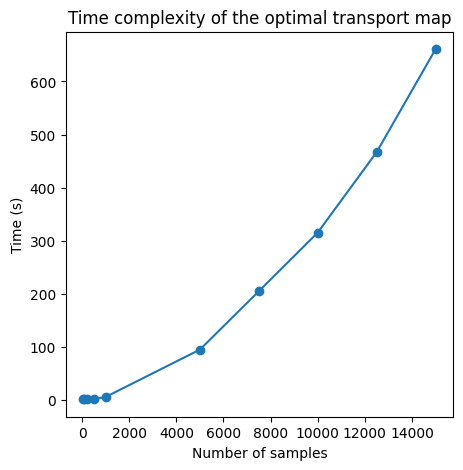

In [10]:
fig, ax = plt.subplots(figsize=(5, 5))

ax.plot(n_samples, list(times.values()), marker='o')

plt.xlabel('Number of samples')
plt.ylabel('Time (s)')
plt.title('Time complexity of the optimal transport map')
plt.show()

$$
t = C \cdot n^{\alpha}
$$
$$
log(t) = log(C) + \alpha \cdot log(n)
$$


On this graph we can see the optimal transport map for different sample sizes, ranging from 50 to 15,000 samples. We can have the intuition that the algorithm run in $O(n^2)$, we will use a regression to confirm it. We want to fit $T(n) = a*n^b$, to data points $(n, T(n))$. The goal is to estimate the coefficients $a$ and $b$, it quantifies the algorithm's complexity. This predictive ability is key for optimizing parameters.

In [11]:
import statsmodels.api as sm
import numpy as np

X = np.log(np.array(n_samples))
X = sm.add_constant(X)
y = np.array(list(times.values()))

model = sm.OLS(np.log(y), X)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     87.56
Date:                Thu, 18 Jul 2024   Prob (F-statistic):           1.39e-05
Time:                        17:05:54   Log-Likelihood:                -10.891
No. Observations:                  10   AIC:                             25.78
Df Residuals:                       8   BIC:                             26.39
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.2179      0.939     -5.558      0.0

C:\Program Files\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=10



##### we find $1 < \alpha < 2$ with a p-value indicating stastistical significance. This suggests that the time complexity of the optimal transport map indeed at worst quadratic.

### Testing the optimal epsilon value

As suggested by Theorem 3, the optimal value of $\epsilon$ is given by:
$$
\epsilon \asymp n^{\frac{1}{d'+1+\bar{\alpha}}}
$$
where $d' = 2\left\lceil \frac{d}{2} \right\rceil$ and $\bar{\alpha} = \alpha \wedge 3$ is the regularity of the map.

In [12]:
def retrieve_theorem_epsilon(n, d, alpha):
    d_prime = 2 * jnp.ceil(d/2)
    alpha_bar = jnp.minimum(alpha, 3)
    epsilon = n**(1/(d_prime + 1 + alpha_bar))
    return float(epsilon)

#### Take random epsilon such that:
$$
\epsilon = \mathcal{N}(\epsilon^*, 0.1 \epsilon^*)
$$

In [13]:
dimensions = [2, 4, 8, 16]
n_samples = [50, 100, 200, 500, 1000, 5000]
times = dict()
alpha = 3
n_iterations = 10

In [14]:
import time
from tqdm import tqdm
import jax
import jax.numpy as jnp

dimensions = [2, 4, 8, 16]
n_samples = [50, 100, 200, 500, 1000, 5000]
times = dict()
alpha = 3
n_iterations = 10
rng_key = 42


for d in dimensions:
    for n in n_samples:
        epsilon_star = retrieve_theorem_epsilon(n, d, alpha)
        for iter_idx in tqdm(range(n_iterations), desc=f"dim={d}, samples={n}"):
            rng = jax.random.PRNGKey(rng_key)

            # Random epsilon choice
            epsilon = jax.random.normal(rng) * epsilon_star + epsilon_star
            epsilon = float(epsilon)

            samples = jax.random.multivariate_normal(rng, jnp.ones(d), jnp.eye(d) / d, (n,))
            target_samples = gravitational_lensing(samples, strength=10)

            start = time.time()
            map = optimal_transport_map(samples, target_samples, epsilon=epsilon)
            end = time.time()

            # Store the result in the times dictionary
            key = (n, d, epsilon, epsilon_star, iter_idx)
            times[key] = end - start




dim=16, samples=5000: 100%|████████████████████████████████████████████████████████████| 10/10 [00:30<00:00,  3.04s/it]


In [16]:
# explode the tuple column
times_df = pd.DataFrame(times.keys(), columns=['n', 'd', 'epsilon', 'epsilon_star', 'iter_idx'])
times_df['time'] = list(times.values())

ValueError: Shape of passed values is (5, 1), indices imply (5, 5)

In [17]:
times_df['epsilon_diff'] = abs(times_df['epsilon'] - times_df['epsilon_star'])

NameError: name 'times_df' is not defined

Text(0, 0.5, 'Time (s)')

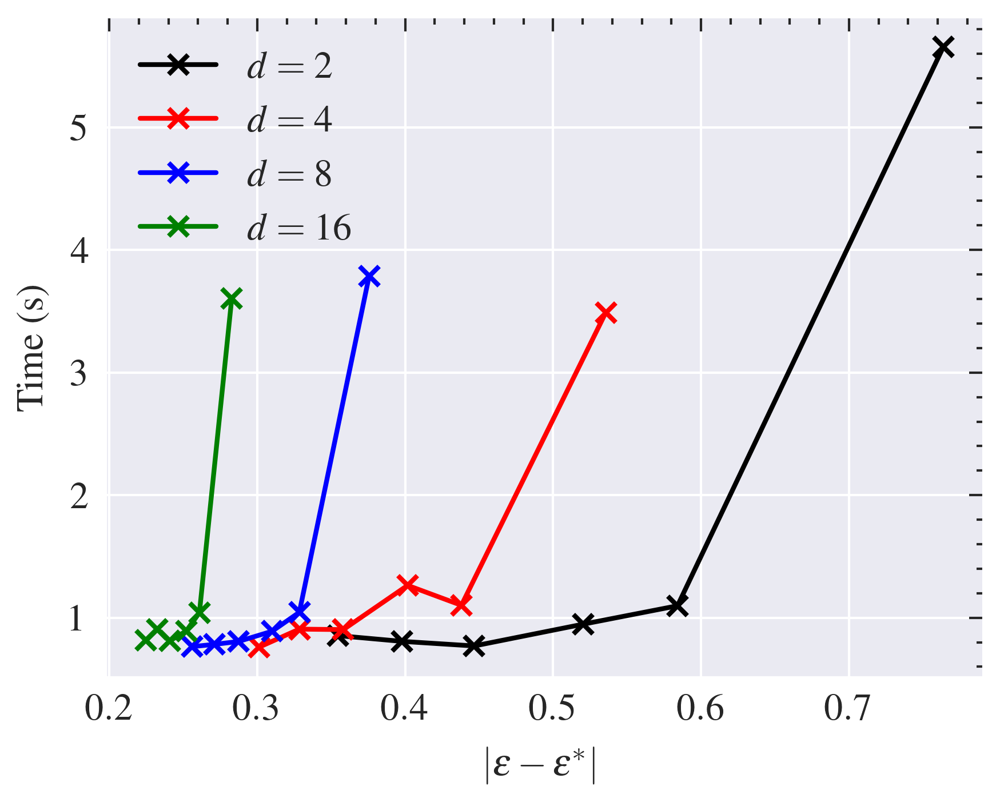

In [54]:
eps_d_df = times_df.pivot_table(index='epsilon_diff', columns='d', values='time', aggfunc='mean')

for col in eps_d_df.columns:
    plt.plot(eps_d_df[col].dropna().index, eps_d_df[col].dropna(),
             marker='x',
             label=rf'$d={col}$',
             linestyle='-',
             markersize=4)

    plt.legend()

plt.xlabel(r'$|\epsilon - \epsilon^*|$')
plt.ylabel('Time (s)')

This graph illustrates random variations in $\epsilon^{*}$ underscores the necessity of closely adhering to the optimal value, as even minor deviations can result in significant escalations in computation time. This underscores the criticality of selecting an appropriate $\epsilon^{k}$ value to ensure manageable computation times in optimal transport tasks.





<Axes: xlabel='n', ylabel='d'>

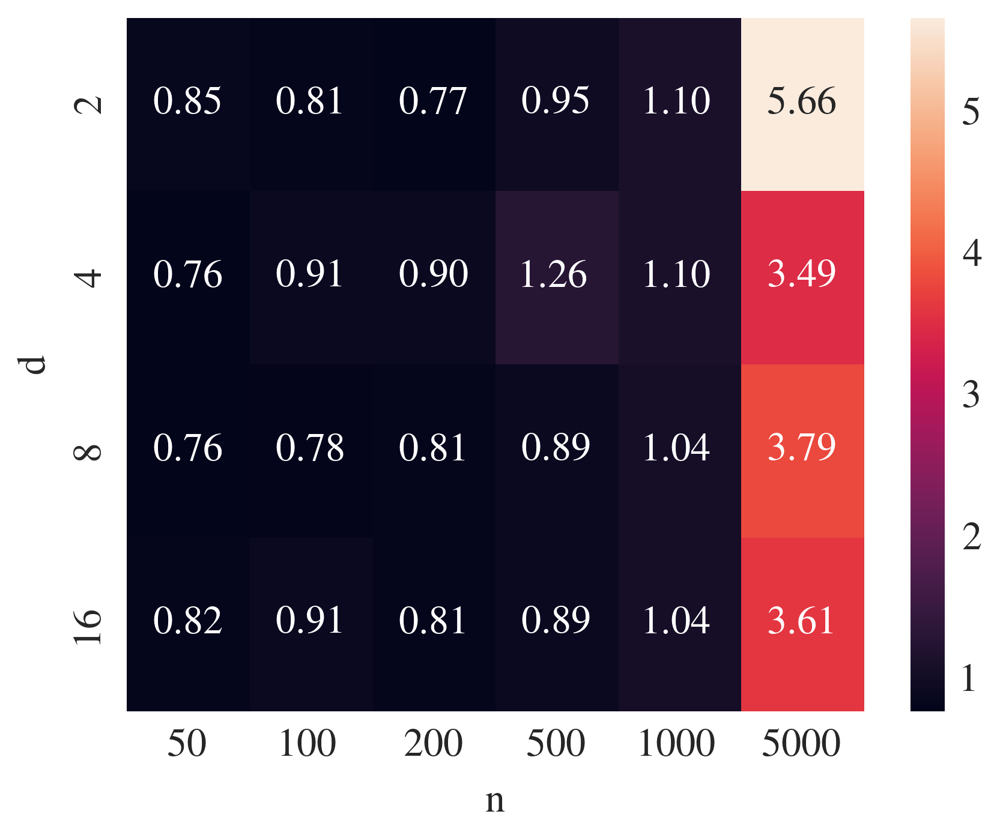

In [58]:
eps_n_d = times_df.pivot_table(index='d', columns='n', values='time', aggfunc='mean')
sns.heatmap(eps_n_d, annot=True, fmt=".2f", cmap='crest')

## Real data exploration: Bivariate Copulas

#### Crypto Data

We will use a copula samples between multiples pairs of FX assets. We will compute the optimal transport map between the two indices and visualize the transported samples. As a quick intro to the data, let us remind what copulas are.

Copula distributions provide a powerful framework for modeling the dependence structure between random variables. Sklar's theorem is a fundamental result in copula theory, stating that any joint distribution function can be decomposed into its marginal distribution functions and a copula function. Mathematically, let $ F(x_1, x_2, ..., x_n) $ be the joint distribution function of $ n $ random variables, and $ F_i(x_i) $ be the marginal distribution function of each variable $ x_i $. Sklar's theorem asserts that there exists a copula function $ C(u_1, u_2, ..., u_n) $ such that:

$$ F(x_1, x_2, ..., x_n) = C(F_1(x_1), F_2(x_2), ..., F_n(x_n)) $$

Basically copulas are valuable tools in various fields, offering a flexible approach to modeling different types of dependence relationships, including positive, negative, and non-monotonic associations. In the following, we will bivariate copulas with Gumbel distribution which have the following density function:

$$ c(u, v) = \exp(-[(-\log(u))^{\theta} + (-\log(v))^{\theta}]^{1/\theta}) $$

where $ (u, v)$ are the marginals and $ \theta $ is the parameter of the copula.

This copula provides an assymetry between the marginals, which can be useful in modeling the dependence structure between the different FX assets and which makes it a good candidate for our analysis, to see if the optimal transport map is able to capture the complex and non-linear structure of the samples and transport them to the target samples.

#### Load the data

In [36]:
import ccxt
import pandas as pd

exchange = ccxt.binance()
symbol_list = ['BTC/USDT', 'ETH/USDT', 'LTC/USDT', 'XRP/USDT', 'ADA/USDT', 'DOT/USDT', 'LINK/USDT', 'UNI/USDT', 'XLM/USDT', 'DOGE/USDT']
timeframe = '1d'
limit = 200

data_close = {}

for symbol in symbol_list:
    ohlcv = exchange.fetch_ohlcv(symbol, timeframe, limit=limit)
    df = pd.DataFrame(ohlcv, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
    df.set_index('timestamp', inplace=True)
    data_close[symbol] = df['close']

    
close_data = pd.DataFrame(data_close).dropna()
    


#### Fit copula density to the data and ranking it

In [37]:
rank_close_data = close_data.rank(pct=True)

from copulas.bivariate import Gumbel
import numpy as np

assets = rank_close_data.columns
pairs = [(assets[i], assets[j]) for i in range(len(assets)) for j in range(i+1, len(assets))]

In [38]:
copulas = dict()

for pair in pairs:
    copula = Gumbel()
    copula_arr = np.array(rank_close_data[list(pair)])
    try:
        copula.fit(copula_arr)
        copulas[pair] = copula
        print(f'Fitted copula for {pair}')
    except ValueError:
        # Usually happens when the Kendall tau's is too high
        print(f'Failed to fit copula for {pair}')


Fitted copula for ('BTC/USDT', 'ETH/USDT')
Fitted copula for ('BTC/USDT', 'LTC/USDT')
Fitted copula for ('BTC/USDT', 'XRP/USDT')
Fitted copula for ('BTC/USDT', 'ADA/USDT')
Fitted copula for ('BTC/USDT', 'DOT/USDT')
Fitted copula for ('BTC/USDT', 'LINK/USDT')
Fitted copula for ('BTC/USDT', 'UNI/USDT')
Fitted copula for ('BTC/USDT', 'XLM/USDT')
Fitted copula for ('BTC/USDT', 'DOGE/USDT')
Fitted copula for ('ETH/USDT', 'LTC/USDT')
Fitted copula for ('ETH/USDT', 'XRP/USDT')
Fitted copula for ('ETH/USDT', 'ADA/USDT')
Fitted copula for ('ETH/USDT', 'DOT/USDT')
Fitted copula for ('ETH/USDT', 'LINK/USDT')
Fitted copula for ('ETH/USDT', 'UNI/USDT')
Fitted copula for ('ETH/USDT', 'XLM/USDT')
Fitted copula for ('ETH/USDT', 'DOGE/USDT')
Fitted copula for ('LTC/USDT', 'XRP/USDT')
Fitted copula for ('LTC/USDT', 'ADA/USDT')
Fitted copula for ('LTC/USDT', 'DOT/USDT')
Fitted copula for ('LTC/USDT', 'LINK/USDT')
Fitted copula for ('LTC/USDT', 'UNI/USDT')
Fitted copula for ('LTC/USDT', 'XLM/USDT')
Fitted

### Sample visualisation of the copulae

In [39]:
n = 2000
crypto_samples = dict()

for pair, copula in copulas.items():
    crypto_samples[pair] = jnp.array(copula.sample(n))

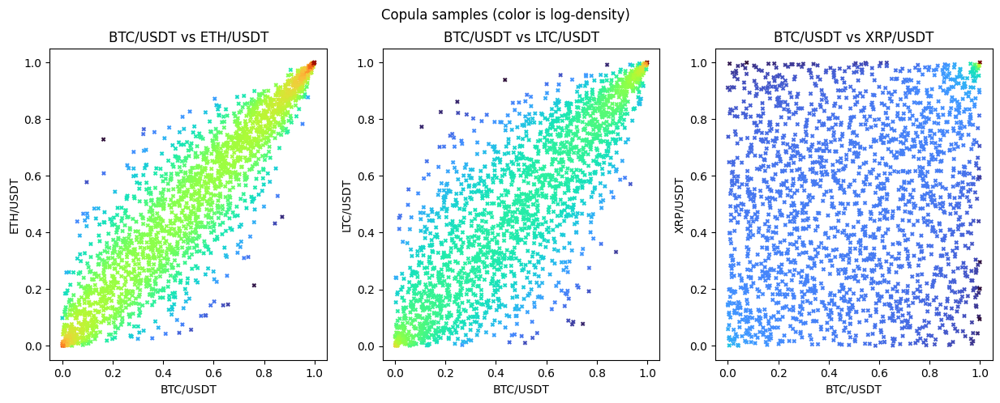

In [40]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, pair in enumerate(list(crypto_samples.keys())[:3]):
    samples = crypto_samples[pair]
    axs[i].scatter(samples[:, 0],
                   samples[:, 1],
                   c=jnp.log(copulas[pair].pdf(samples)),
                   cmap='turbo',
                   s=9,
                   marker='x')

    axs[i].set_xlabel(pair[0])
    axs[i].set_ylabel(pair[1])
    fig.suptitle('Copula samples (color is log-density)')
    axs[i].set_title(f'{pair[0]} vs {pair[1]}')

In [ ]:
# Computations of the optimal transport map between the first 4 pairs of Crypto assets
n_test = 500
i = 0
mse_scores = dict()

for pair_1 in copulas.keys():
    for pair_2 in copulas.keys():
        if pair_1 != pair_2:
            samples_1 = fx_samples[pair_1]
            samples_2 = fx_samples[pair_2]

            map = optimal_transport_map(samples_1, samples_2, epsilon=1e-3)
            test_samples = rank_close_data[list(pair_1)].sample(n_test)

            transported_samples = map(test_samples.values)
            second_pair_samples = rank_close_data[list(pair_2)].loc[test_samples.index].values

            print(f'Samples from the optimal transport map between {pair_1} and {pair_2}')
            plot_point_clouds(second_pair_samples, transported_samples, dim=2)
            mse_scores[(pair_1, pair_2)] = jnp.mean((second_pair_samples - transported_samples)**2)

            i += 1
            if i == 3:
                break

In [ ]:
mse_scores_df = pd.DataFrame(mse_scores.values(), index=mse_scores.keys(), columns=['MSE'], dtype=float)
mse_scores_df.plot(kind='bar', figsize=(10, 5))
plt.ylabel('MSE')
plt.title('MSE scores between the transported samples and the target samples')
plt.show()

In [ ]:
pair_1, pair_2 = mse_scores_df.idxmin().values[0]

samples_1 = fx_samples[pair_1]
samples_2 = fx_samples[pair_2]

map = optimal_transport_map(samples_1, samples_2, epsilon=1e-3)
test_samples = rank_close_data[list(pair_1)].sample(n_test)

transported_samples = map(test_samples.values)
second_pair_samples = rank_close_data[list(pair_2)].loc[test_samples.index].values

print(f'Samples from the optimal transport map between {pair_1} and {pair_2}')
plot_point_clouds(second_pair_samples, transported_samples, dim=2)

### Load data Forex

The data can be download at this link : https://www.kaggle.com/datasets/amin233/forex-top-currency-pairs-20002020

In [13]:
data = []

for file in os.listdir('fx_data'):
    if file.endswith('.csv'):
        data.append(pd.read_csv('fx_data/' + file))

In [14]:
# Merge all the 'CLOSE' columns in a single dataframe
close_data = pd.concat([df['CLOSE'] for df in data], axis=1).iloc[:4000, :].dropna()
close_data.columns = [file.split('.')[0][:6] for file in os.listdir('fx_data')]
del(data)

#### Fit copula density to the data and ranking it

In [15]:
rank_close_data = close_data.rank(pct=True)

In [19]:
from copulas.bivariate import Gumbel
import numpy as np

In [20]:
assets = rank_close_data.columns
pairs = [(assets[i], assets[j]) for i in range(len(assets)) for j in range(i+1, len(assets))]

In [21]:
copulas = dict()

for pair in pairs:
    copula = Gumbel()
    copula_arr = np.array(rank_close_data[list(pair)])
    try:
        copula.fit(copula_arr)
        copulas[pair] = copula
        print(f'Fitted copula for {pair}')
    except ValueError:
        # Usually happens when the Kendall tau's is too high
        print(f'Failed to fit copula for {pair}')


Fitted copula for ('AUDUSD', 'EURCHF')
Failed to fit copula for ('AUDUSD', 'EURJPY')
Fitted copula for ('AUDUSD', 'EURUSD')
Failed to fit copula for ('AUDUSD', 'USDCAD')
Failed to fit copula for ('AUDUSD', 'USDCHF')
Failed to fit copula for ('AUDUSD', 'USDJPY')
Failed to fit copula for ('EURCHF', 'EURJPY')
Fitted copula for ('EURCHF', 'EURUSD')
Failed to fit copula for ('EURCHF', 'USDCAD')
Failed to fit copula for ('EURCHF', 'USDCHF')
Failed to fit copula for ('EURCHF', 'USDJPY')
Fitted copula for ('EURJPY', 'EURUSD')
Fitted copula for ('EURJPY', 'USDCAD')
Failed to fit copula for ('EURJPY', 'USDCHF')
Fitted copula for ('EURJPY', 'USDJPY')
Fitted copula for ('EURUSD', 'USDCAD')
Failed to fit copula for ('EURUSD', 'USDCHF')
Failed to fit copula for ('EURUSD', 'USDJPY')
Failed to fit copula for ('USDCAD', 'USDCHF')
Fitted copula for ('USDCAD', 'USDJPY')
Fitted copula for ('USDCHF', 'USDJPY')


#### Sample visualisation of the copulas

In [22]:
n = 2000
fx_samples = dict()

for pair, copula in copulas.items():
    fx_samples[pair] = jnp.array(copula.sample(n))

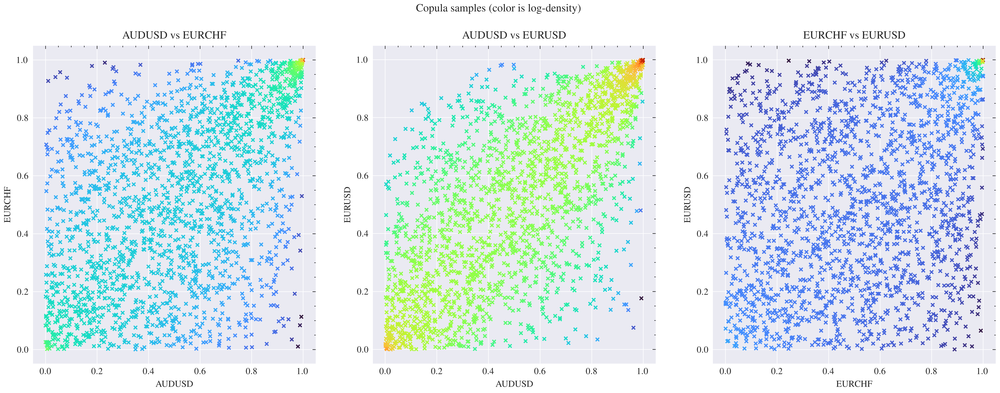

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, pair in enumerate(list(fx_samples.keys())[:3]):
    samples = fx_samples[pair]
    axs[i].scatter(samples[:, 0],
                   samples[:, 1],
                   c=jnp.log(copulas[pair].pdf(samples)),
                   cmap='turbo',
                   s=9,
                   marker='x')

    axs[i].set_xlabel(pair[0])
    axs[i].set_ylabel(pair[1])
    fig.suptitle('Copula samples (color is log-density)')
    axs[i].set_title(f'{pair[0]} vs {pair[1]}')

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('AUDUSD', 'EURUSD')


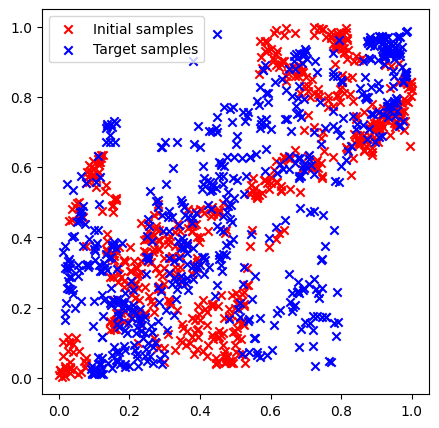

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('EURCHF', 'EURUSD')


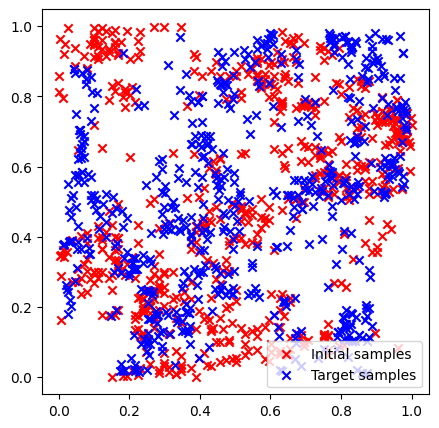

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('EURJPY', 'EURUSD')


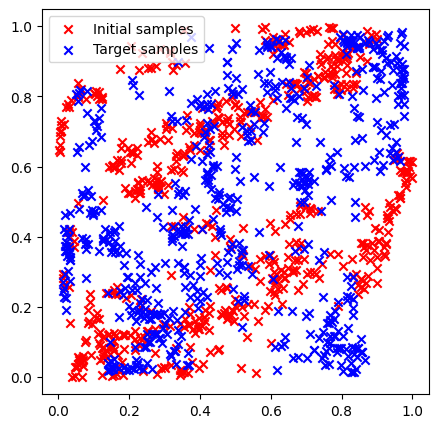

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('EURJPY', 'USDCAD')


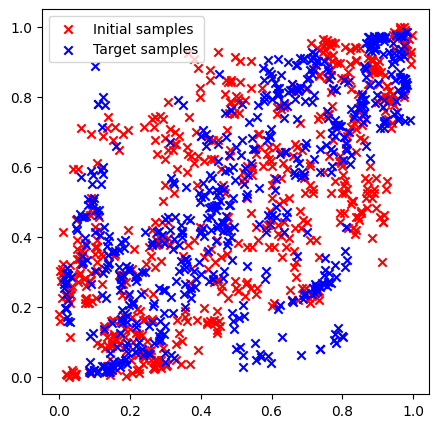

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('EURJPY', 'USDJPY')


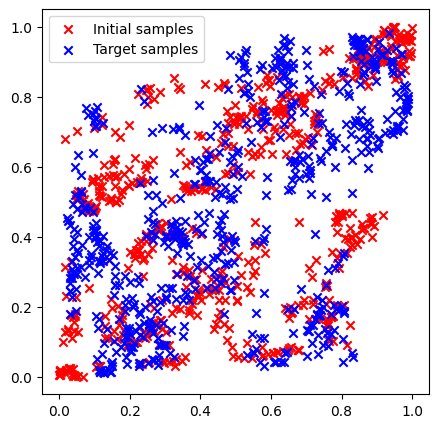

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('EURUSD', 'USDCAD')


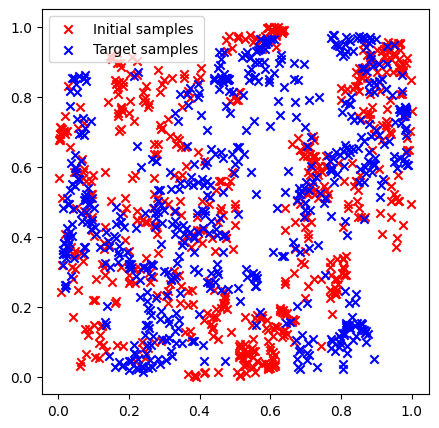

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('USDCAD', 'USDJPY')


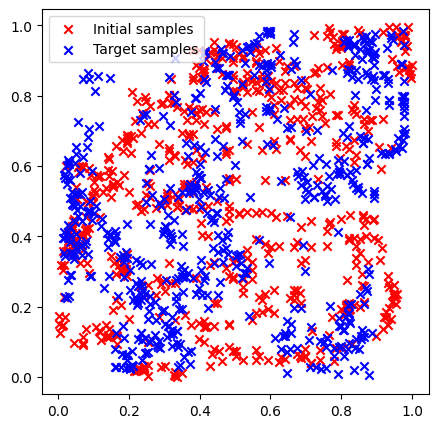

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('USDCHF', 'USDJPY')


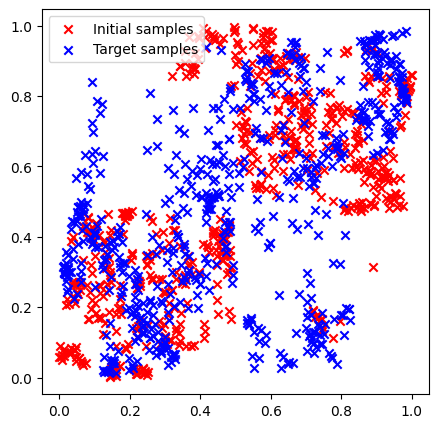

Samples from the optimal transport map between ('AUDUSD', 'EURUSD') and ('AUDUSD', 'EURCHF')


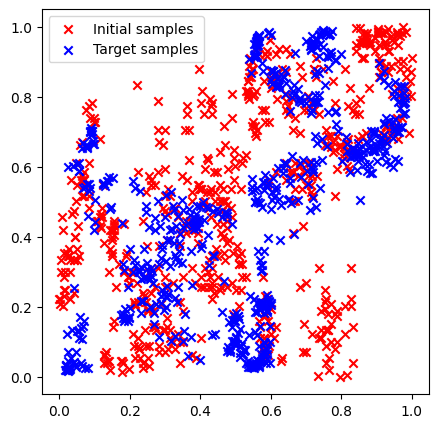

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('AUDUSD', 'EURCHF')


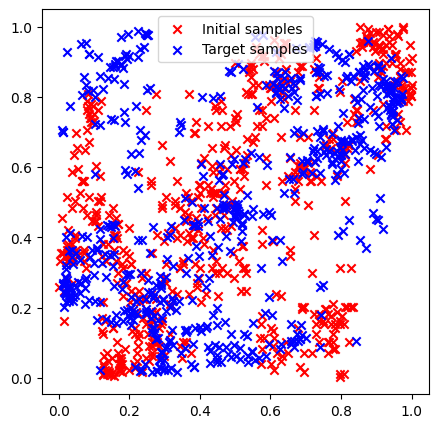

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('AUDUSD', 'EURUSD')


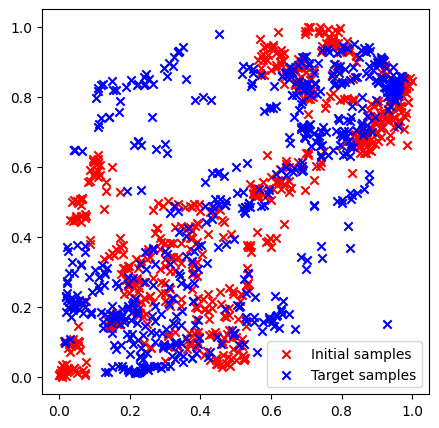

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('EURJPY', 'EURUSD')


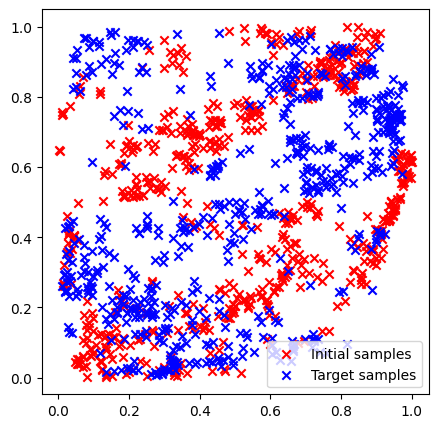

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('EURJPY', 'USDCAD')


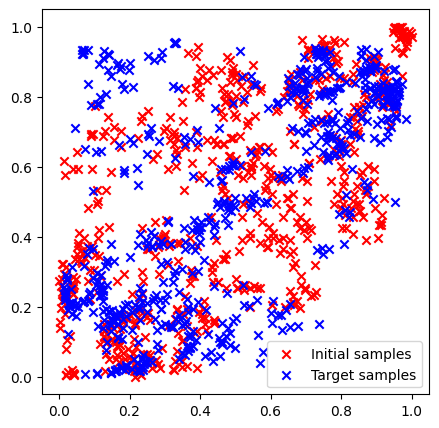

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('EURJPY', 'USDJPY')


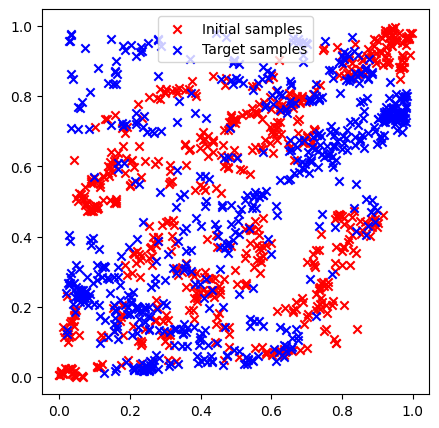

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('EURUSD', 'USDCAD')


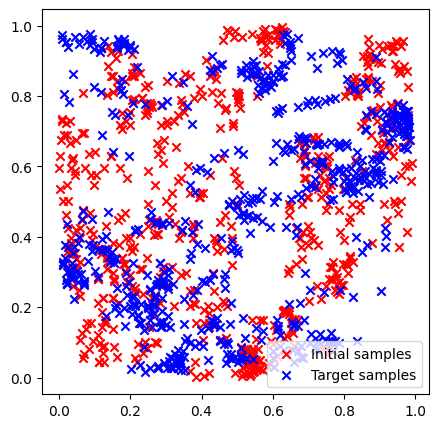

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('USDCAD', 'USDJPY')


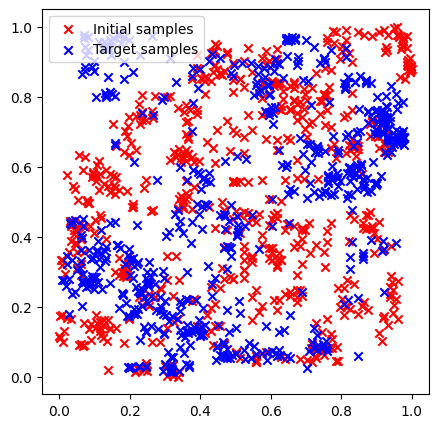

KeyboardInterrupt: 

In [38]:
# Computations of the optimal transport map between the first 4 pairs of FX assets
n_test = 600
i = 0
mse_scores = dict()

for pair_1 in copulas.keys():
    for pair_2 in copulas.keys():
        if pair_1 != pair_2:
            samples_1 = fx_samples[pair_1]
            samples_2 = fx_samples[pair_2]

            map = optimal_transport_map(samples_1, samples_2, epsilon=1e-3)
            test_samples = rank_close_data[list(pair_1)].sample(n_test)

            transported_samples = map(test_samples.values)
            second_pair_samples = rank_close_data[list(pair_2)].loc[test_samples.index].values

            print(f'Samples from the optimal transport map between {pair_1} and {pair_2}')
            plot_point_clouds(second_pair_samples, transported_samples, dim=2)
            mse_scores[(pair_1, pair_2)] = jnp.mean((second_pair_samples - transported_samples)**2)

            i += 1
            if i == 3:
                break

The plot below present the different MSE scores between the transported samples and the target samples.
The fact that we are working on copula marginals which are bounded between 0 and 1 makes the different values of MSE comparable between the different pairs of pairs of FX assets.

The reader can notice that the MSE scores are quite high, which suggests that the transported samples are quite different from the target samples. This is expected as the copula samples are not the true distribution of the FX assets.

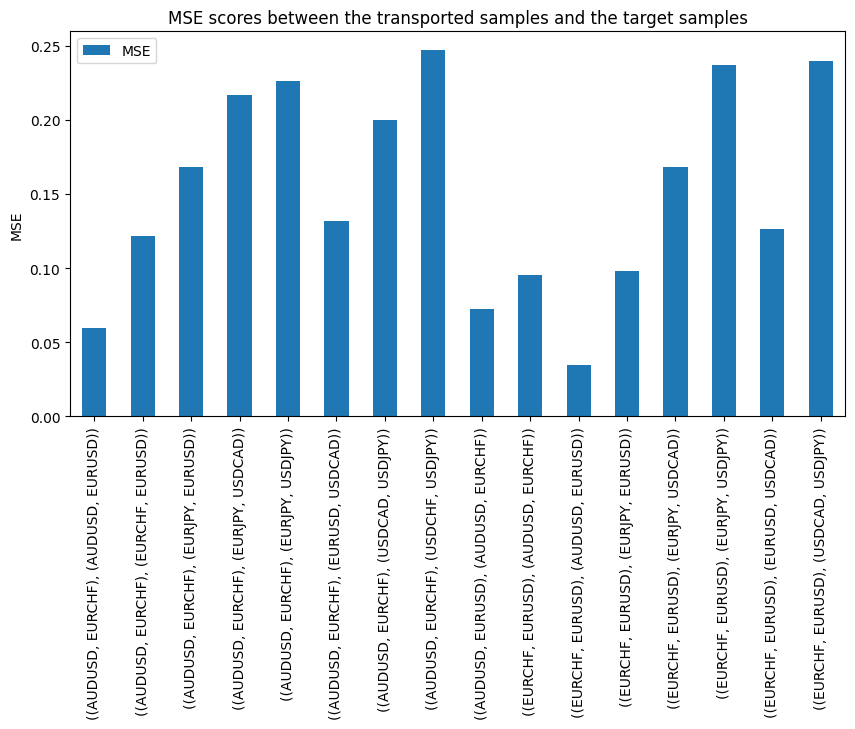

In [42]:

mse_scores_df = pd.DataFrame(mse_scores.values(), index=mse_scores.keys(), columns=['MSE'], dtype=float)
mse_scores_df.plot(kind='bar', figsize=(10, 5))
plt.ylabel('MSE')
plt.title('MSE scores between the transported samples and the target samples')
plt.show()

### Pair of pairs with the highest MSE scores

Next, we will visualize the pairs of pairs that has the highest and lowest MSE scores. We will compute the optimal transport map between the two pairs and visualize the transported samples and the real ones.

Samples from the optimal transport map between ('AUDUSD', 'EURCHF') and ('USDCHF', 'USDJPY')


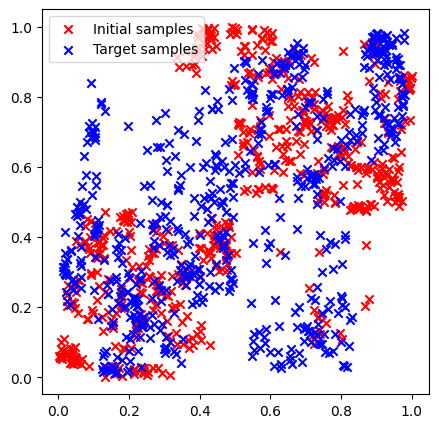

In [44]:
pair_1, pair_2 = mse_scores_df.idxmax().values[0]

samples_1 = fx_samples[pair_1]
samples_2 = fx_samples[pair_2]

map = optimal_transport_map(samples_1, samples_2, epsilon=1e-3)
test_samples = rank_close_data[list(pair_1)].sample(n_test)

transported_samples = map(test_samples.values)
second_pair_samples = rank_close_data[list(pair_2)].loc[test_samples.index].values

print(f'Samples from the optimal transport map between {pair_1} and {pair_2}')
plot_point_clouds(second_pair_samples, transported_samples, dim=2)

Samples from the optimal transport map between ('EURCHF', 'EURUSD') and ('AUDUSD', 'EURUSD')


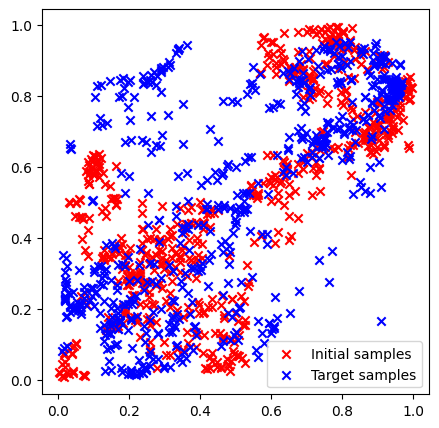

In [45]:
pair_1, pair_2 = mse_scores_df.idxmin().values[0]

samples_1 = fx_samples[pair_1]
samples_2 = fx_samples[pair_2]

map = optimal_transport_map(samples_1, samples_2, epsilon=1e-3)
test_samples = rank_close_data[list(pair_1)].sample(n_test)

transported_samples = map(test_samples.values)
second_pair_samples = rank_close_data[list(pair_2)].loc[test_samples.index].values

print(f'Samples from the optimal transport map between {pair_1} and {pair_2}')
plot_point_clouds(second_pair_samples, transported_samples, dim=2)

It is clear that the optimal transport map is able to transport the samples from one pair of FX assets to another. The MSE scores can be quite high, which suggests that the transported samples are quite different from the target samples. This is expected as the copula samples are not the true distribution of the spreads between FX assets.

However, the optimal transport map is able to capture the complex and non-linear structure of the samples and transport them to the target samples as shown in the plot representing the pair of pairs that has the lowest MSE. The reader can notice that the "best" pair of pairs features the EURUSD which is the most traded currency pair in the world. But an interesting point lies in the macroeconomic relation between the AUDUSD and EURCHF which are both linked to the price of gold. This relationship is known to be highly complex and non-linear and the optimal transport map is able to capture this relation and transport the samples accordingly.